### Cloning the Yolov5 Repo

In [ ]:
main_data_dir = '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo'

In [ ]:
!pwd

/content


In [ ]:
%cd '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo'

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo


In [ ]:
! git clone https://github.com/ultralytics/yolov5 # clone repo
! cd yolov5
! pip install wandb -qr requirements.txt # install requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 12852, done.
remote: Total 12852 (delta 0), reused 0 (delta 0), pack-reused 12852
Receiving objects: 100% (12852/12852), 11.82 MiB | 6.19 MiB/s, done.
Resolving deltas: 100% (8930/8930), done.


In [ ]:
! cd yolov5

In [ ]:
!pwd

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo


In [ ]:
! pip install wandb

     |████████████████████████████████| 1.8 MB 5.2 MB/s 
     |████████████████████████████████| 181 kB 43.8 MB/s 
     |████████████████████████████████| 144 kB 44.7 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=4ea5eeb4472ad1dbf5f8631abaff1aec758ad1b708fcd7d46536aec985726535
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools


In [ ]:
! pip install -qr '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/requirements.txt'

In [ ]:
%cd yolov5

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5


### Configuring Custom .yaml file

In [ ]:
!echo "train: Dataset/train/images" > data/alpr.yaml
!echo "val:   Dataset/train/images" >> data/alpr.yaml

!echo "nc : 1" >> data/alpr.yaml
!echo "names: ['plate']" >> data/alpr.yaml

!cat data/alpr.yaml

/bin/bash: data/alpr.yaml: No such file or directory
/bin/bash: data/alpr.yaml: No such file or directory
/bin/bash: data/alpr.yaml: No such file or directory
/bin/bash: data/alpr.yaml: No such file or directory
cat: data/alpr.yaml: No such file or directory


In [ ]:
import os
import numpy as np
from pathlib import Path
from xml.dom.minidom import parse
from shutil import copyfile

In [ ]:
# FILE_ROOT = "/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Capstone/voc_plate_dataset"
# IMAGE_PATH = os.path.join(FILE_ROOT, 'JPEGImages') 
# ANNOTATIONS_PATH = os.path.join(FILE_ROOT, 'Annotations')
DATA_ROOT = "Dataset/"
DEST_IMAGES_PATH = "train/images"
DEST_LABELS_PATH = "train/labels"

In [ ]:
!mkdir -p Dataset/train/labels

In [ ]:
!mkdir -p Dataset/train/images

In [ ]:
!mkdir -p Dataset/val/

In [ ]:
len(os.listdir('/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations'))

In [ ]:
len(os.listdir('/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/images'))

### Converting the annotations as per Yolov5 configs

In [ ]:
def cord_converter(size, box):
    """
    convert xml annotation to darknet format coordinates
    :param size： [w,h]
    :param box: anchor box coordinates [upper-left x,uppler-left y,lower-right x, lower-right y]
    :return: converted [x,y,w,h]
    """
    x1 = int(box[0])
    y1 = int(box[1])
    x2 = int(box[2])
    y2 = int(box[3])

    dw = np.float32(1. / int(size[0]))
    dh = np.float32(1. / int(size[1]))

    w = x2 - x1
    h = y2 - y1
    x = x1 + (w / 2)
    y = y1 + (h / 2)

    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return [x, y, w, h]
    
def save_file(img_jpg_file_name, size, img_box):
    classes = ['plate']
    save_file_name = DATA_ROOT + DEST_LABELS_PATH + '/' + img_jpg_file_name + '.txt'
    print(save_file_name)
    file_path = open(save_file_name, "a+")
    for box in img_box:                  
        #cls_num = classes.index(box[0]) # find class_id
        cls_num = 0
        new_box = cord_converter(size, box[1:]) # convert box coord into YOLO x,y,w,h

        file_path.write(f"{cls_num} {new_box[0]} {new_box[1]} {new_box[2]} {new_box[3]}\n")

    file_path.flush()
    file_path.close()
    
def get_xml_data(file_path, img_xml_file):
    img_path = file_path + '/' + img_xml_file + '.xml'
    print(img_path)

    dom = parse(img_path)
    root = dom.documentElement
    img_name = root.getElementsByTagName("filename")[0].childNodes[0].data
    img_size = root.getElementsByTagName("size")[0]
    objects = root.getElementsByTagName("object")
    img_w = img_size.getElementsByTagName("width")[0].childNodes[0].data
    img_h = img_size.getElementsByTagName("height")[0].childNodes[0].data
    img_c = img_size.getElementsByTagName("depth")[0].childNodes[0].data
    # print("img_name:", img_name)
    # print("image_info:(w,h,c)", img_w, img_h, img_c)
    img_box = []
    for box in objects:
        cls_name = box.getElementsByTagName("name")[0].childNodes[0].data
        x1 = int(box.getElementsByTagName("xmin")[0].childNodes[0].data)
        y1 = int(box.getElementsByTagName("ymin")[0].childNodes[0].data)
        x2 = int(box.getElementsByTagName("xmax")[0].childNodes[0].data)
        y2 = int(box.getElementsByTagName("ymax")[0].childNodes[0].data)
        print("box:(c,xmin,ymin,xmax,ymax)", cls_name, x1, y1, x2, y2)
        img_jpg_file_name = img_xml_file + '.jpg'
        img_box.append([cls_name, x1, y1, x2, y2])
    # print(img_box)
    # test_dataset_box_feature(img_jpg_file_name, img_box)
    save_file(img_xml_file, [img_w, img_h], img_box)

In [ ]:
#class x_center y_center width height

In [ ]:
ANNOTATIONS_PATH = '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations'
files = os.listdir(ANNOTATIONS_PATH)
for file in files:
    print("file name: ", file)
    file_xml = file.split(".")
    get_xml_data(ANNOTATIONS_PATH, file_xml[0])

file name:  brightnessquandoi79.xml
/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations/brightnessquandoi79.xml
box:(c,xmin,ymin,xmax,ymax) plate 424 270 468 289
Dataset/train/labels/brightnessquandoi79.txt
file name:  brightnessquandoi19.xml
/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations/brightnessquandoi19.xml
box:(c,xmin,ymin,xmax,ymax) plate 142 209 186 225
Dataset/train/labels/brightnessquandoi19.txt
file name:  brightnessquandoi17.xml
/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations/brightnessquandoi17.xml
box:(c,xmin,ymin,xmax,ymax) plate 454 284 500 301
Dataset/train/labels/brightnessquandoi17.txt
file name:  brightnessquandoi15.xml
/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/Dataset/train/annotations/brightnessquandoi15.xml
box:(c,xmin,ymin,xmax,y

In [ ]:
!ls Dataset/train/labels

brightnessngoaigiao0.txt   CarLongPlate133.txt	CarLongPlate72.txt
brightnessngoaigiao10.txt  CarLongPlate134.txt	CarLongPlate73.txt
brightnessngoaigiao11.txt  CarLongPlate135.txt	CarLongPlate74.txt
brightnessngoaigiao12.txt  CarLongPlate136.txt	CarLongPlate75.txt
brightnessngoaigiao13.txt  CarLongPlate137.txt	CarLongPlate76.txt
brightnessngoaigiao14.txt  CarLongPlate138.txt	CarLongPlate77.txt
brightnessngoaigiao15.txt  CarLongPlate139.txt	CarLongPlate78.txt
brightnessngoaigiao1.txt   CarLongPlate13.txt	CarLongPlate79.txt
brightnessngoaigiao2.txt   CarLongPlate140.txt	CarLongPlate7.txt
brightnessngoaigiao3.txt   CarLongPlate141.txt	CarLongPlate80.txt
brightnessngoaigiao4.txt   CarLongPlate142.txt	CarLongPlate81.txt
brightnessngoaigiao5.txt   CarLongPlate143.txt	CarLongPlate82.txt
brightnessngoaigiao6.txt   CarLongPlate144.txt	CarLongPlate83.txt
brightnessngoaigiao7.txt   CarLongPlate145.txt	CarLongPlate84.txt
brightnessngoaigiao8.txt   CarLongPlate146.txt	CarLongPlate85.txt
brightnessng

### Model Training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 300 --data data/alpr.yaml --cfg models/yolov5s.yaml

In [ ]:
%cd ..

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo


In [ ]:
!git clone https://github.com/openalpr/benchmarks

Cloning into 'benchmarks'...
remote: Enumerating objects: 1752, done.
remote: Total 1752 (delta 0), reused 0 (delta 0), pack-reused 1752
Receiving objects: 100% (1752/1752), 187.98 MiB | 14.73 MiB/s, done.
Resolving deltas: 100% (34/34), done.
Checking out files: 100% (1707/1707), done.


In [ ]:
%cd yolov5

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5


### Model Detection

In [ ]:
!python detect.py --source '../benchmarks/endtoend/us' --conf 0.4 --weights 'runs/train/exp/weights/best.pt' --save-txt

detect: weights=['runs/train/exp/weights/best.pt'], source=../benchmarks/endtoend/us, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: MLE: not found
/bin/sh: 1: Batch: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/222 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/us/0b86cecf-67d1-4fc0-87c9-b36b0ee228bb.jpg: 384x640 1 plate, Done. (0

In [ ]:
!python detect.py --source ../benchmarks/endtoend/eu --conf 0.4 --weights runs/train/exp/weights/best.pt --save-txt

detect: weights=['runs/train/exp/weights/best.pt'], source=../benchmarks/endtoend/eu, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: /bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
MLE: not found
/bin/sh: 1: Batch: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/108 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/eu/eu1.jpg: 480x640 Done. (0.030s)
image 2/108 /content/drive/Shareddr

In [ ]:
!python detect.py --source ../benchmarks/endtoend/br --conf 0.4 --weights runs/train/exp/weights/best.pt --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best.pt'], source=../benchmarks/endtoend/br, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: MLE: not found
/bin/sh: 1: Batch: not found
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/115 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/br/AYO9034.jpg: 384x640 1 plate, Done. (0.027s)
image 2/115 /content/dr

In [ ]:
%cd /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5


### TensorBoard Logging

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### Number Plate Recognising thru EasyOCR

In [ ]:
!pip install easyocr

     |████████████████████████████████| 70.8 MB 13 kB/s 
     |████████████████████████████████| 47.6 MB 1.4 MB/s 


0 0.470313 0.459722 0.0625 0.05


(720, 1280, 3)

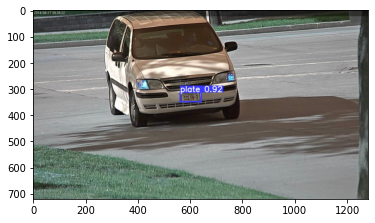

In [ ]:
!cat './runs/detect/exp2/labels/1e241dc8-8f18-4955-8988-03a0ab49f813.txt'
img = cv2.imread('./runs/detect/exp2/1e241dc8-8f18-4955-8988-03a0ab49f813.jpg')
plt.imshow(img)
img.shape

In [ ]:
!ls runs/detect/exp2/labels

0b86cecf-67d1-4fc0-87c9-b36b0ee228bb.txt  wts-lg-000038.txt  wts-lg-000123.txt
1e241dc8-8f18-4955-8988-03a0ab49f813.txt  wts-lg-000039.txt  wts-lg-000124.txt
22e54a62-57a8-4a0a-88c1-4b9758f67651.txt  wts-lg-000040.txt  wts-lg-000125.txt
316b64c0-55bf-4079-a1c0-d93f461a576f.txt  wts-lg-000041.txt  wts-lg-000127.txt
33fa5185-0286-4e8f-b775-46162eba39d4.txt  wts-lg-000042.txt  wts-lg-000128.txt
37170dd1-2802-4e38-b982-c5d07c64ff67.txt  wts-lg-000043.txt  wts-lg-000129.txt
3850ba91-3c64-4c64-acba-0c46b61ec0da.txt  wts-lg-000044.txt  wts-lg-000130.txt
4be2025c-09f7-4bb0-b1bd-8e8633e6dec1.txt  wts-lg-000045.txt  wts-lg-000131.txt
5b562a61-34ad-4f00-9164-d34abb7a38e4.txt  wts-lg-000046.txt  wts-lg-000132.txt
7fbfbe28-aecb-45be-bd05-7cf26acb3c5c.txt  wts-lg-000047.txt  wts-lg-000133.txt
c9368c55-210d-456c-a5ef-c310e60039ec.txt  wts-lg-000048.txt  wts-lg-000134.txt
car11.txt				  wts-lg-000049.txt  wts-lg-000135.txt
car12.txt				  wts-lg-000050.txt  wts-lg-000136.txt
car13.txt				  wts-lg-00005

In [ ]:
# read .txt to get x,y,w,h of ALPR
def read_txt(filepath):
    f = open(filepath, 'r')
    lines = f.readlines()
         
    # read objects from each line of .txt
    objects = []
    for line in lines:
      line=line.rstrip()
      obj = [int(float(i)) for i in line.split(' ')]
      # objects.append(obj)
      print(line)
    # return objects

In [ ]:
DETECT_PATH = '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp2'
IMG_NAME  = 'car2'

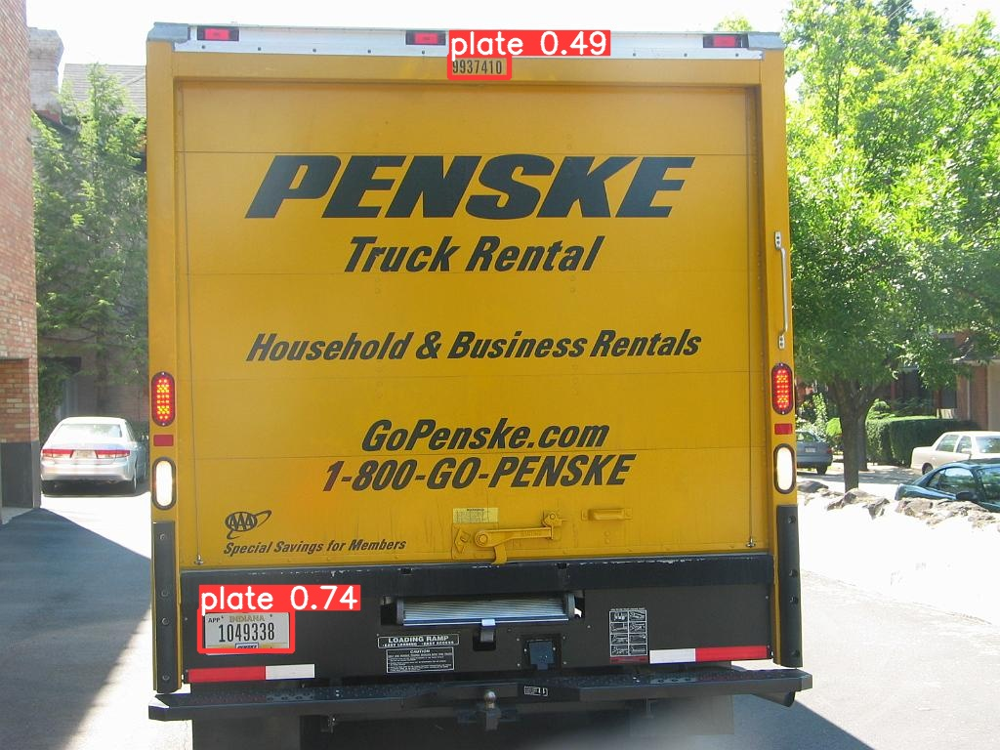

In [ ]:
Image(DETECT_PATH+'/'+IMG_NAME+'.jpg')

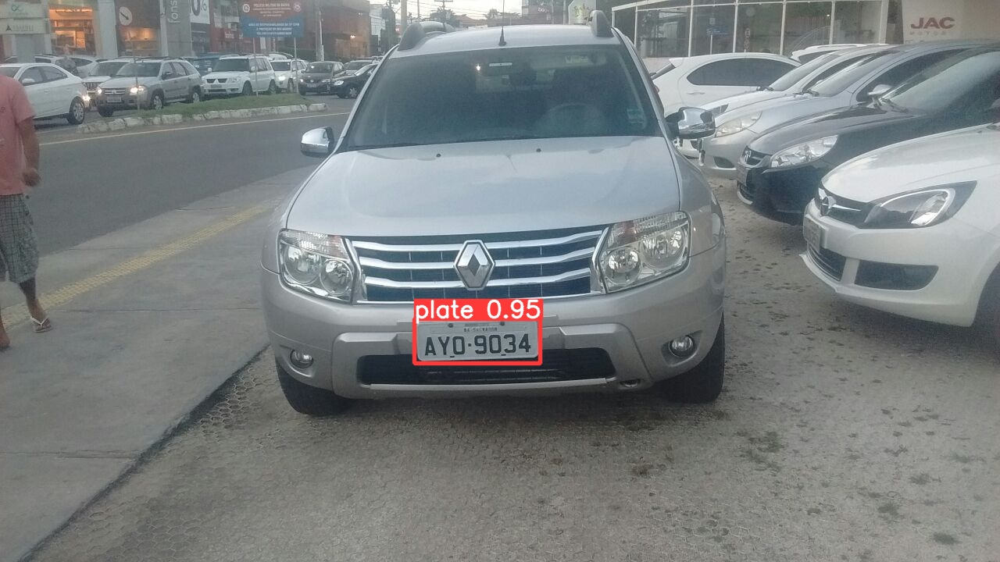

In [ ]:
Image('/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/AYO9034.jpg')

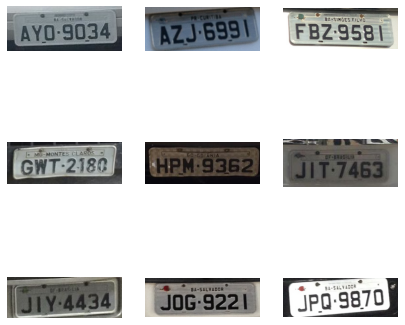

In [ ]:
plt.figure(figsize=(7,7))
i=0
for img_path in cropped_images_paths[:9]: 
  plt.subplot(3,3,i+1)
  plt.axis('off')
  img = plt.imread(img_path)
  plt.imshow(img)
  i+=1

In [ ]:
def find_index_of_maxarea(res):
  max_area = 0
  ind = 0
  i = 0
  for finding in res:
    # print(finding)
    coords = finding[0]
    width = coords[1][0] - coords[0][0]
    height = coords[2][1] - coords[1][1]
    # print(width, height)
    area = width*height
    if area > max_area:
      max_area = area
      ind = i
    i+=1
  return ind

# res = [([[120, 21], [203, 21], [203, 39], [120, 39]], 'simoes FIlho', 0.11310183576711651), ([[21, 28], [247, 28], [247, 94], [21, 94]], 'FBZ 958 |', 0.5799241124063174)]
# find_index_of_maxarea(res)

In [ ]:
res = [([[17, 18], [164, 18], [164, 59], [17, 59]], 'AYO 9034', 0.6508392549102756)]
find_area(res)

([[17, 18], [164, 18], [164, 59], [17, 59]], 'AYO 9034', 0.6508392549102756)


ValueError: ignored

In [ ]:
import easyocr
import os
import matplotlib.pyplot as plt
main_data_dir = '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5'
cropped_img_path = os.path.join(main_data_dir, 'runs/detect/exp11/crops/plate/')
cropped_images_paths = []
for i in os.listdir(cropped_img_path):
  cropped_images_paths.append(os.path.join(cropped_img_path, i))

In [ ]:
import random 
def rand_sample():
  samp = []
  for i in range(9):
    r = random.randint(0, len(cropped_images_paths))
    # print(r)
    samp.append(cropped_images_paths[r])
    # print(samp[i])
  return samp

In [ ]:
rand_sample()

['/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/PJJ4955.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/ODJ1599.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/OKV8004.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/OCX4764.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/OVA1319.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/JIY4434.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5/runs/detect/exp11/crops/plate/NYM7544.jpg',
 '/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saur

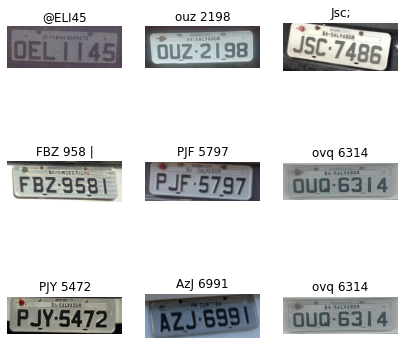

In [ ]:
plt.figure(figsize=(7,7))
sample = rand_sample()
# print(sample)
for i, img_path in enumerate(sample):
  # print(img)
  plt.subplot(3,3,i+1)
  plt.axis('off')
  reader = easyocr.Reader(['en'])
  result = reader.readtext(img_path)
  ind = find_index_of_maxarea(result)
  img = plt.imread(img_path)
  plt.title(result[ind][1])
  plt.imshow(img)

In [ ]:
result[0][1]

'AYO 9034'

In [ ]:
!pwd

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5


### Quantizing and Optimizing

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include tflite onnx engine

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite', 'onnx', 'engine']
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
/bin/sh: 1: MLE: not found
/bin/sh: 1: Batch: not found
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)
requirements: onnx not found and is required by YOLOv5, attempting auto-update...

requirements: 1 package updated per ['onnx']
requirements: ⚠️ Restart runtime or rerun command for updates to tak

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --int8 --include tflite

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=True, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
/bin/sh: 1: MLE: not found
/bin/sh: 1: Batch: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)
requirements: flatbuffers==1.12 not found and is required by YOLOv5, attempting auto-update...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviou

### Running Inference

In [ ]:
!python detect.py --source ../benchmarks/endtoend/Minee --conf 0.4 --weights runs/train/exp/weights/best.pt --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best.pt'], source=../benchmarks/endtoend/Minee, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: Batch: not found
/bin/sh: 1: MLE: not found
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients
image 1/6 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/Minee/1.jpg: 256x640 2 plates, Done. (0.187s)
image 2/6 /content/drive/Shareddrives/2022| MLE Training | Bat

In [ ]:
!python detect.py --source ../benchmarks/endtoend/Minee --conf 0.4 --weights runs/train/exp/weights/best.onnx --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best.onnx'], source=../benchmarks/endtoend/Minee, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
/bin/sh: 1: MLE: not found
/bin/sh: 1: Batch: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Loading runs/train/exp/weights/best.onnx for ONNX Runtime inference...
image 1/6 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/Minee/1.jpg: 640x640 2 plates, Done. (0.320s)
image 2/6 /content/drive/Shareddrives/2022| MLE Training | Batch 2 |

In [ ]:
!python detect.py --source ../benchmarks/endtoend/Minee --conf 0.4 --weights runs/train/exp/weights/best-fp16.tflite --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best-fp16.tflite'], source=../benchmarks/endtoend/Minee, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: Batch: not found
/bin/sh: 1: MLE: not found
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Loading runs/train/exp/weights/best-fp16.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/6 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/Minee/1.jpg: 640x640 2 persons, Done. (0.

In [ ]:
!pwd

/content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/yolov5


In [ ]:
!python detect.py --source ../benchmarks/endtoend/Minee --conf 0.4 --weights runs/train/exp/weights/best-int8.tflite --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best-int8.tflite'], source=../benchmarks/endtoend/Minee, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
/bin/sh: 1: Batch: not found
/bin/sh: 1: MLE: not found
/bin/sh: 1: J2J/Saurabh/Try_Yolo/yolov5: not found
fatal: cannot change to '/content/drive/Shareddrives/2022': No such file or directory
YOLOv5 🚀 2022-4-18 torch 1.10.0+cu111 CPU

Loading runs/train/exp/weights/best-int8.tflite for TensorFlow Lite inference...
image 1/6 /content/drive/Shareddrives/2022| MLE Training | Batch 2 | J2J/Saurabh/Try_Yolo/benchmarks/endtoend/Minee/1.jpg: 640x640 3 persons, Done. (32.440s)
image 2/6 /content/drive/Shareddrives/2022| MLE T